# Ejercicio 4.3

Importar cada una de las 4 librerias:

In [1]:
%matplotlib inline
import matplotlib.pyplot as plt
import cv2 as cv
import skimage as ski
from skimage import io
from skimage.transform import resize, rescale
import PIL as pil

In [2]:
import os

In [3]:
directorio = 'imagenes/' #directorio donde se encuentran las imagenes
files = os.listdir(directorio) #Lista de archivos en el directorio

Nombre de los archivos

In [4]:
files

['Anonymized20200210.dcm',
 'cameraman.tif',
 'house.tif',
 'lake.tif',
 'lena_color_512.tif',
 'peppers_color.tif',
 'rosa800x600.raw']

In [5]:
imgPlt = {}
imgPIL = {}
imgCV = {}
imgSki = {}
for name in files:
    try:   
        imgPlt[name] = plt.imread(directorio+name) 
    except:
        imgPlt[name] = "No se puede leer"
    try:   
        imgPIL[name] = pil.Image.open(directorio+name) 
    except:
        imgPIL[name] = "No se puede leer"
    try:   
        imgCV[name] = cv.imread(directorio+name) 
    except:
        imgCV[name] = "No se puede leer"
    try:   
        imgSki[name] = ski.io.imread(directorio+name) 
    except:
        imgSki[name] = "No se puede leer"

TiffTag 338: 999 is not a valid EXTRASAMPLE
TiffTag 338: 999 is not a valid EXTRASAMPLE
TiffTag 338: 999 is not a valid EXTRASAMPLE


Para leer la imagen en formato raw:

In [6]:
import numpy as np
fd = open('imagenes/rosa800x600.raw', 'rb') 
rows = 800
cols = 600
f = np.fromfile(fd, dtype=np.uint8,count=rows*cols)
imRaw = f.reshape((rows, cols))
fd.close()

## 4.3 Usando funciones de Python ya existentes y la imagen que usted escoja.

#### 4.3.1 Reajusta el tamaño de la carpeta imágenes aumentando a 5 veces su tamaño original

Para reajustar las imagenes se utilizó la función resize de SkImage. Las imagenes que se utilizaron como entrada, son las que se obtuvieron en el primer ejercicio (4.1) con las librerias SkImage y OpenCv, pues son las librerias que lograron leer la mayoria de las imagenes de la carpeta "imagenes". Las imágenes se visualizan utilizando la libreria de matplotlib.

In [7]:
imagenes = { 
    files[0] : imgSki[files[0]], # Gray
    files[1] : imgSki[files[1]], # Gray
    files[2] : imgCV[files[2]],  # Gray
    files[3] : imgCV[files[3]],  # Gray
    files[4] : cv.cvtColor(imgCV[files[4]], cv.COLOR_BGR2RGB),  # RGB 
    files[5] : cv.cvtColor(imgCV[files[5]], cv.COLOR_BGR2RGB),  # RGB 
    files[6] : imRaw             # Gray
}

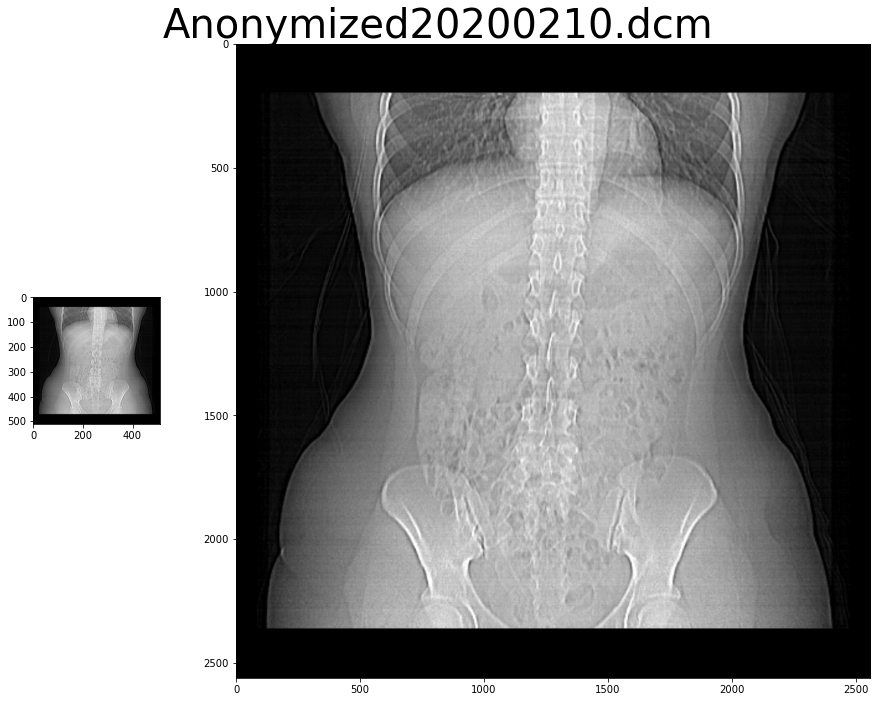

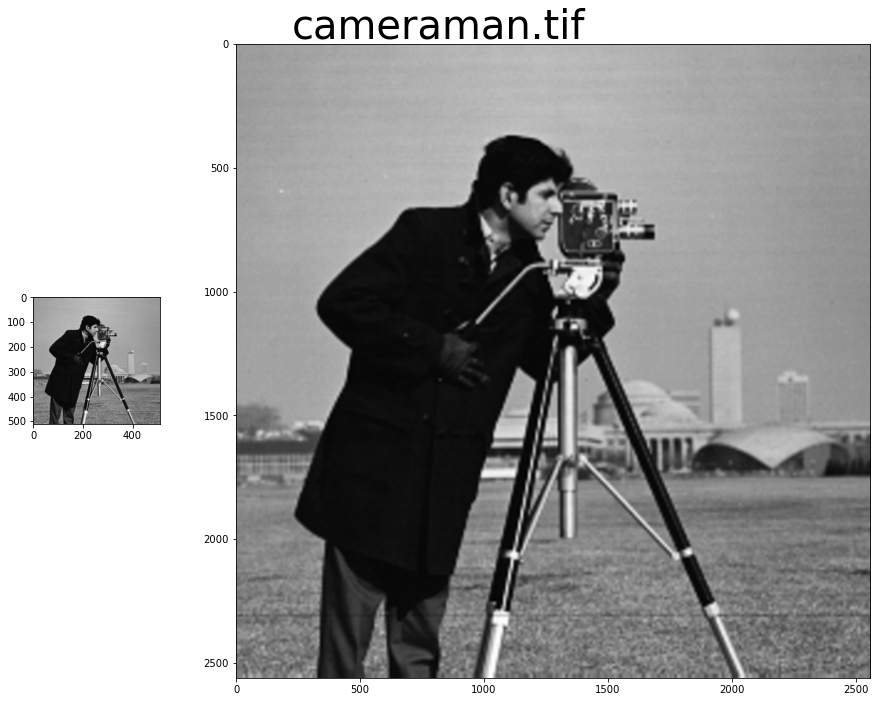

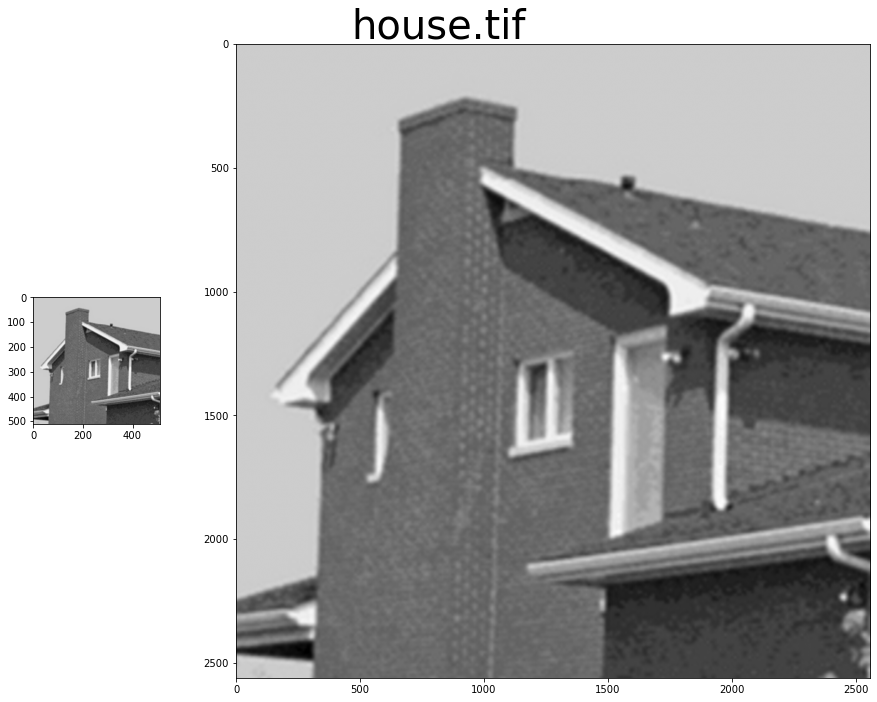

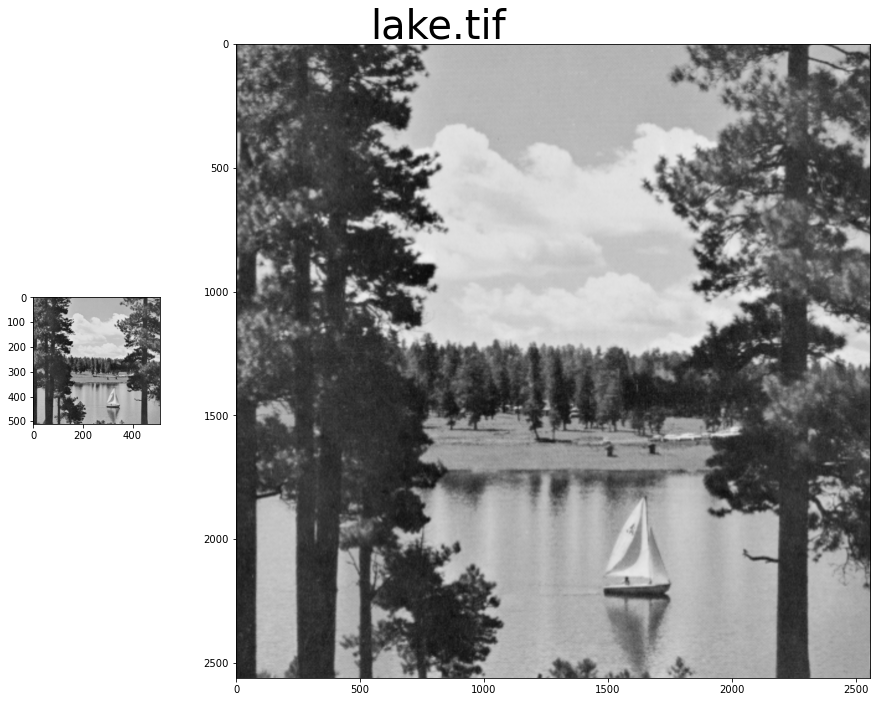

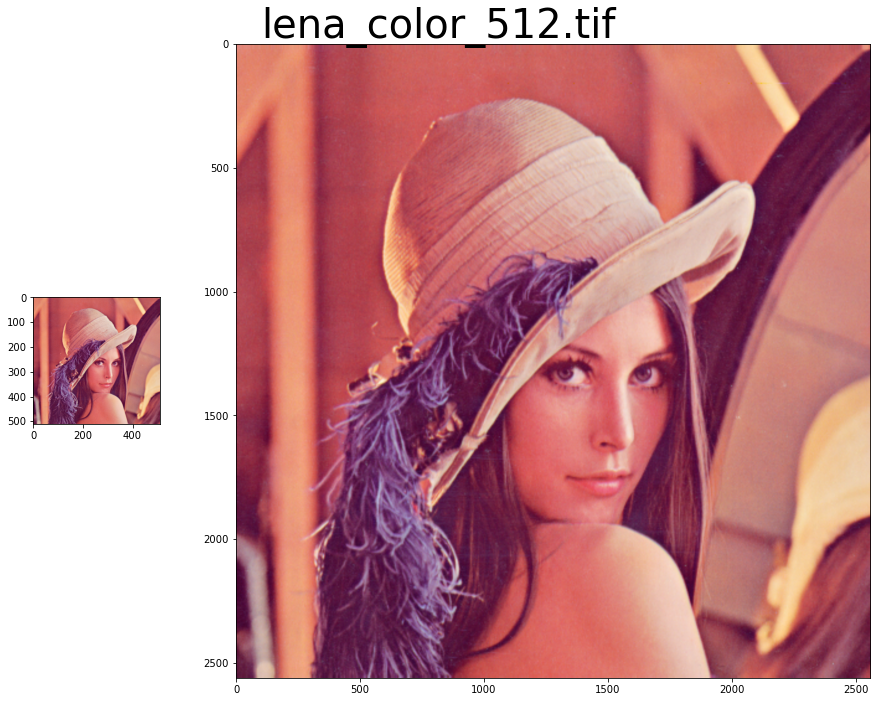

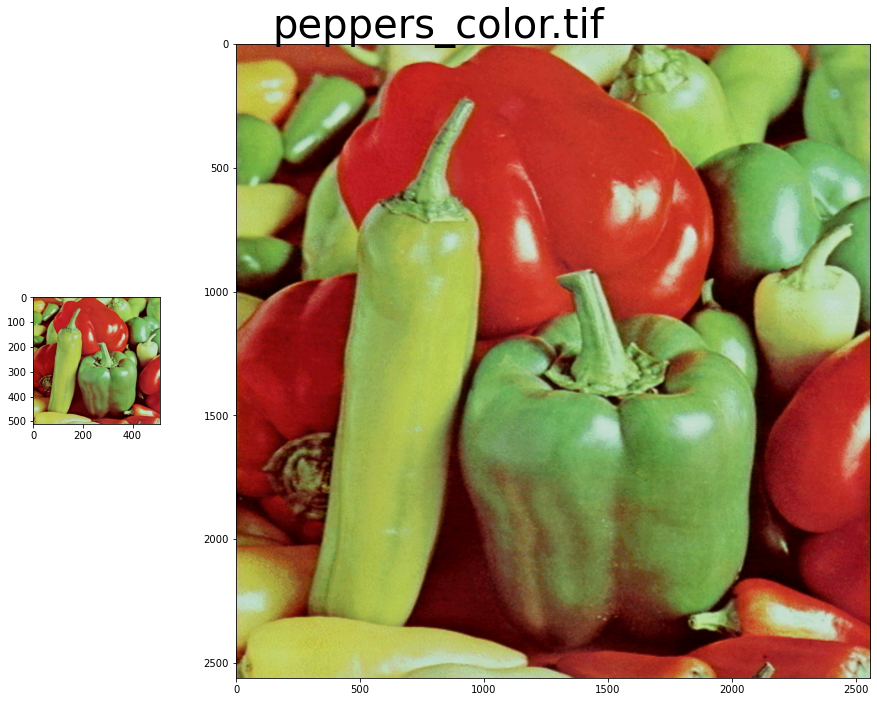

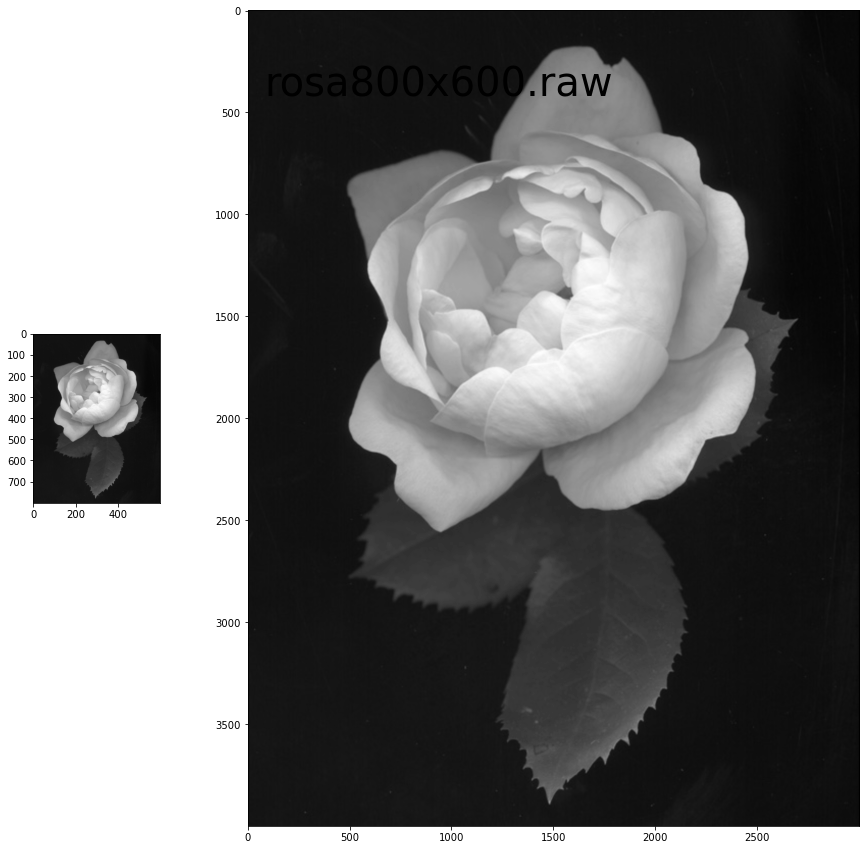

In [8]:
resized = {} # Diccionario de imagenes reajustadas en tamaño 
for name in files: #por cada imagen en la carpeta
    img = imagenes[name]
    width = img.shape[0] #Calcular su anchura original en pixeles 
    heigh = img.shape[1] #Calcular su altura original en pixeles
    resized[name] = resize(img,(width*5,heigh*5)) #Reajustar la imagen 5 veces su tamaño original
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,15),gridspec_kw={'width_ratios': [1, 5]})
    fig.suptitle(name,y=0.83,size=40)
    if( len(img.shape)==3): #Si es una imagen rgb    
        ax1.imshow(img)
        ax2.imshow(resized[name])            
    else: #Es una imagen en grises
        ax1.imshow(img,cmap='gray')
        ax2.imshow(resized[name],cmap='gray') 

#### 4.3.2 Reajusta el tamaño de la carpeta imágenes disminuyendo a 3 veces el tamaño original.

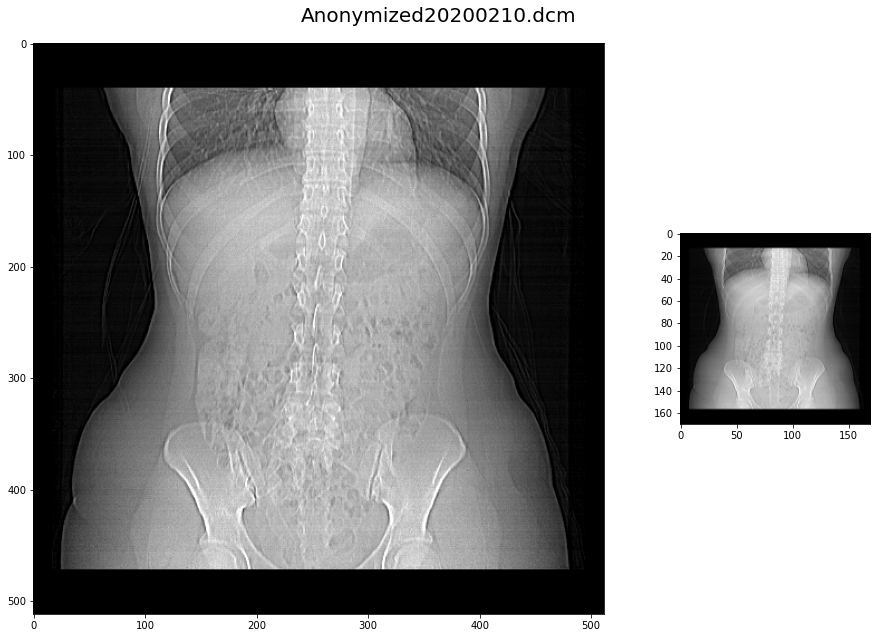

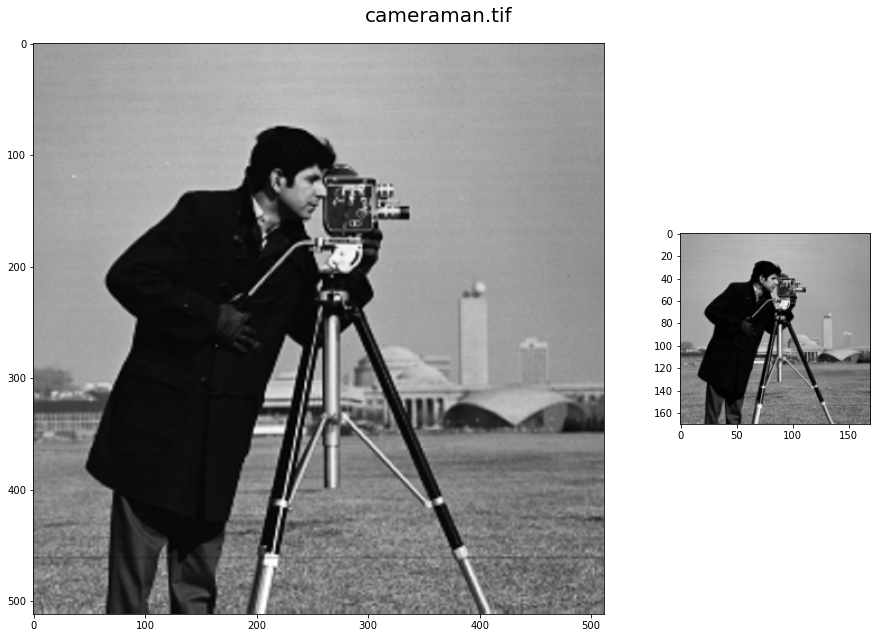

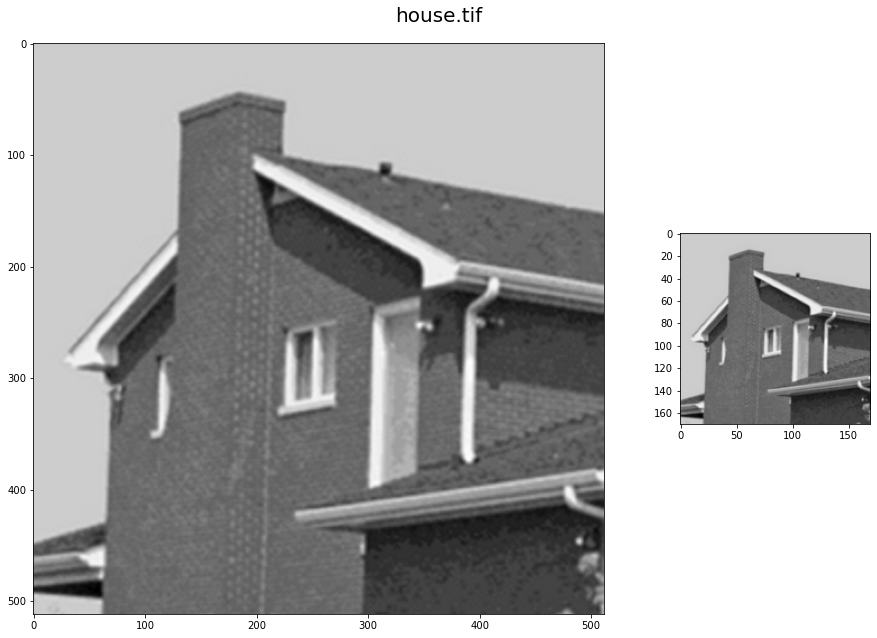

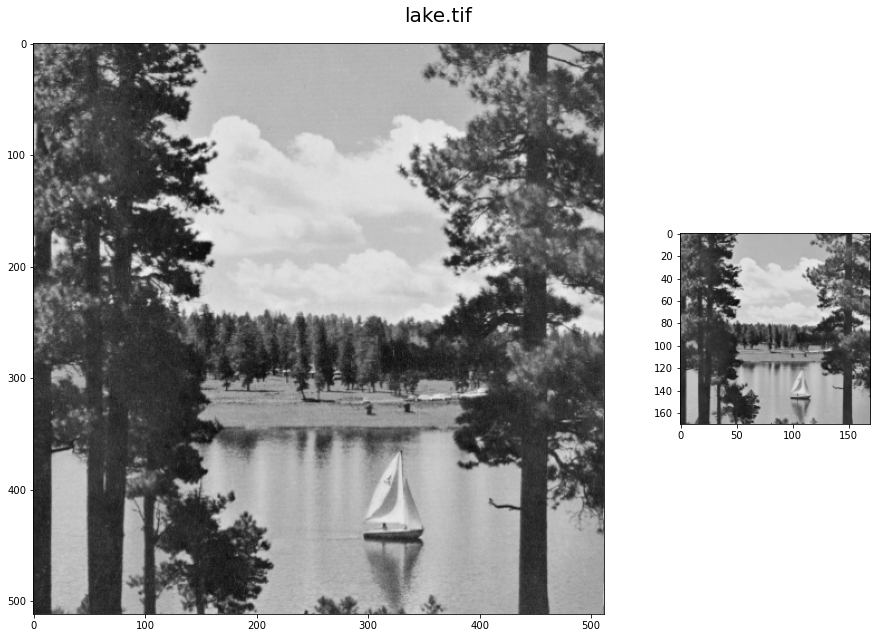

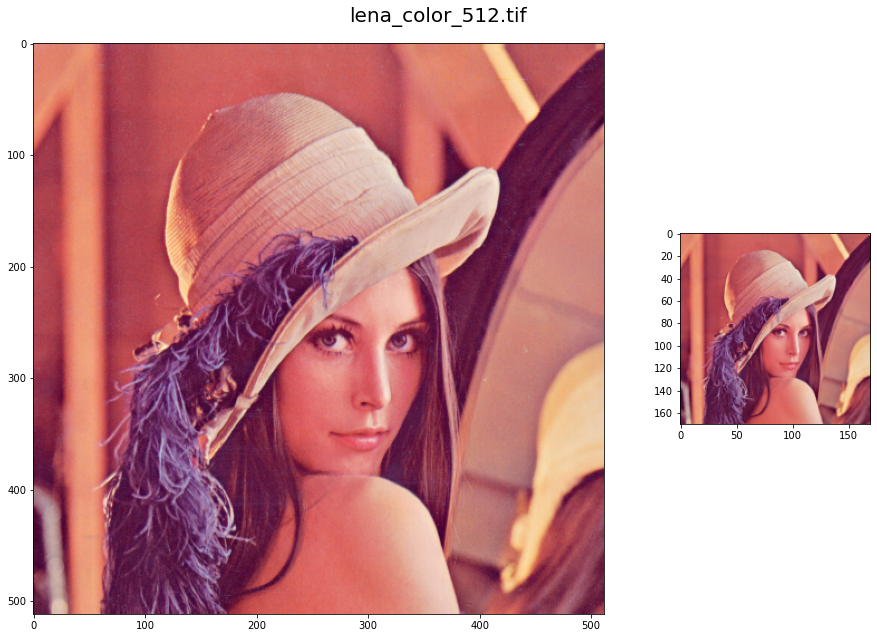

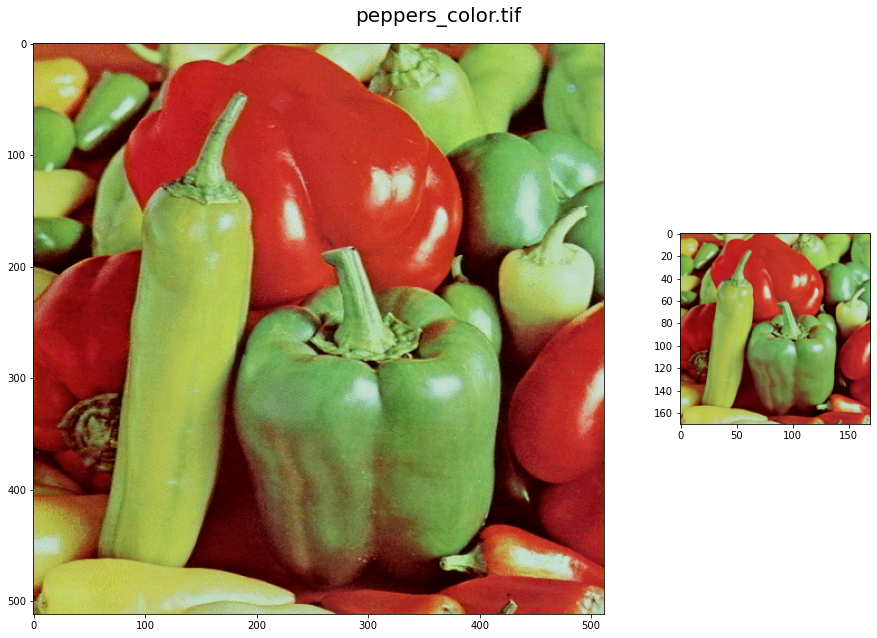

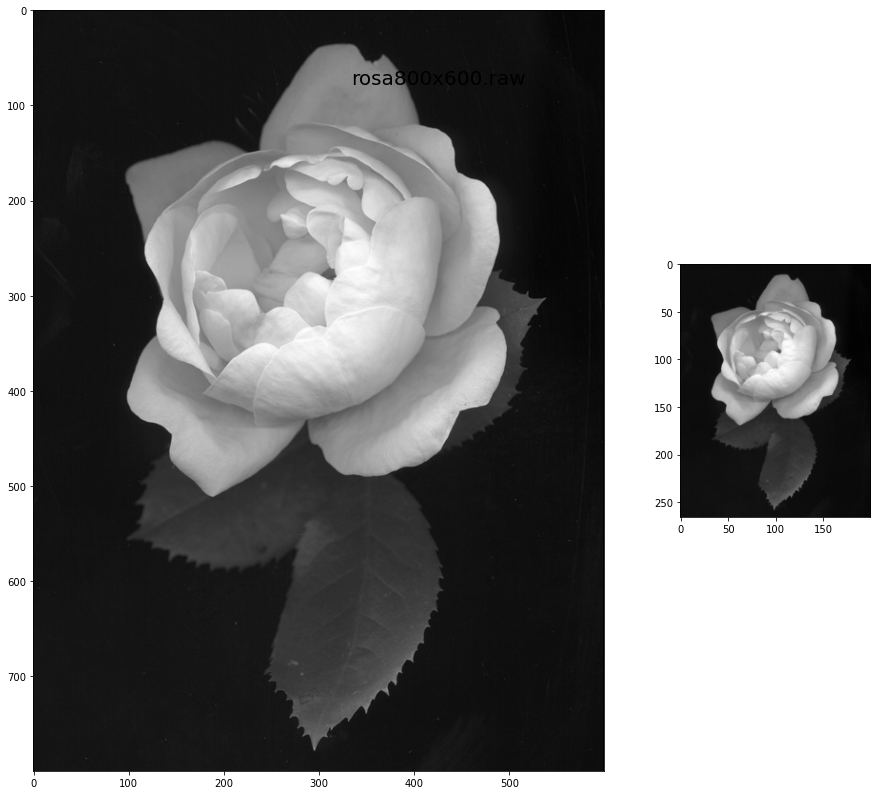

In [9]:
resized_dis = {} # Diccionario de imagenes reajustadas en tamaño 
for name in files: #por cada imagen en la carpeta
    img = imagenes[name]
    width = img.shape[0] #Calcular su anchura original en pixeles 
    heigh = img.shape[1] #Calcular su altura original en pixeles
    resized_dis[name] = resize(img,(width//3,heigh//3)) #Reajustar la imagen 5 veces su tamaño original
    fig, (ax1, ax2) = plt.subplots(1, 2,figsize=(15,15),gridspec_kw={'width_ratios': [3, 1]})
    fig.suptitle(name,y=0.8,size=20)
    if( len(img.shape)==3): #Si es una imagen rgb    
        ax1.imshow(img)
        ax2.imshow(resized_dis[name])            
    else: #Es una imagen en grises
        ax1.imshow(img,cmap='gray')
        ax2.imshow(resized_dis[name],cmap='gray') 

#### 4.3.3. Rote la imagen a 45, 90 y 180 grados, guárdelas en formato .png.

In [10]:
from PIL import Image

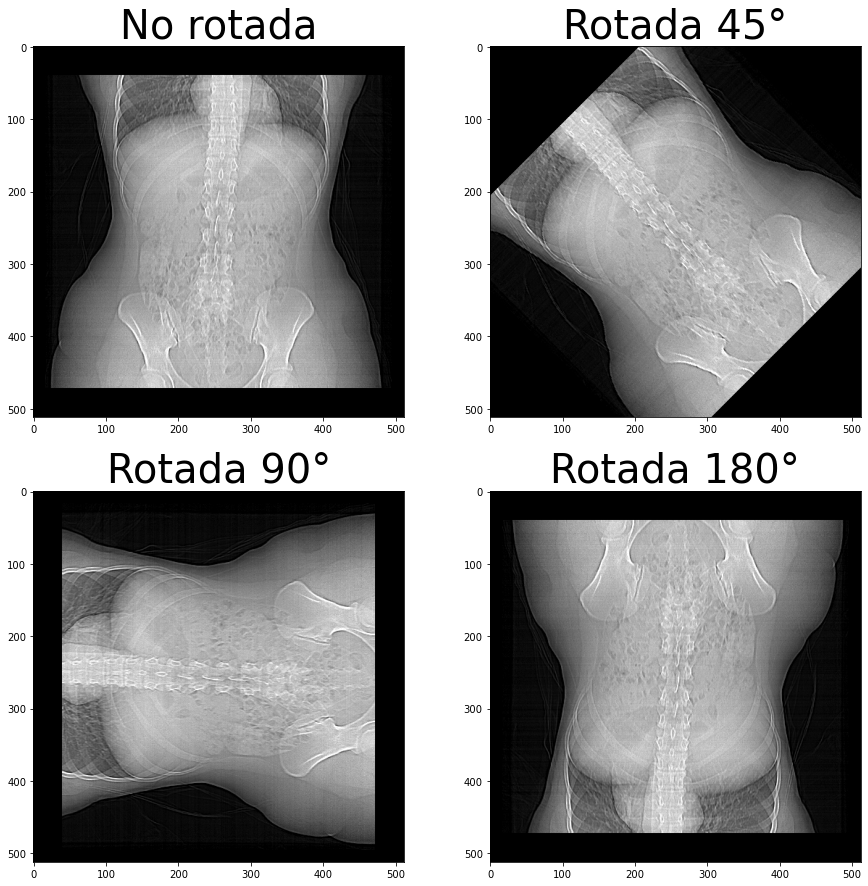

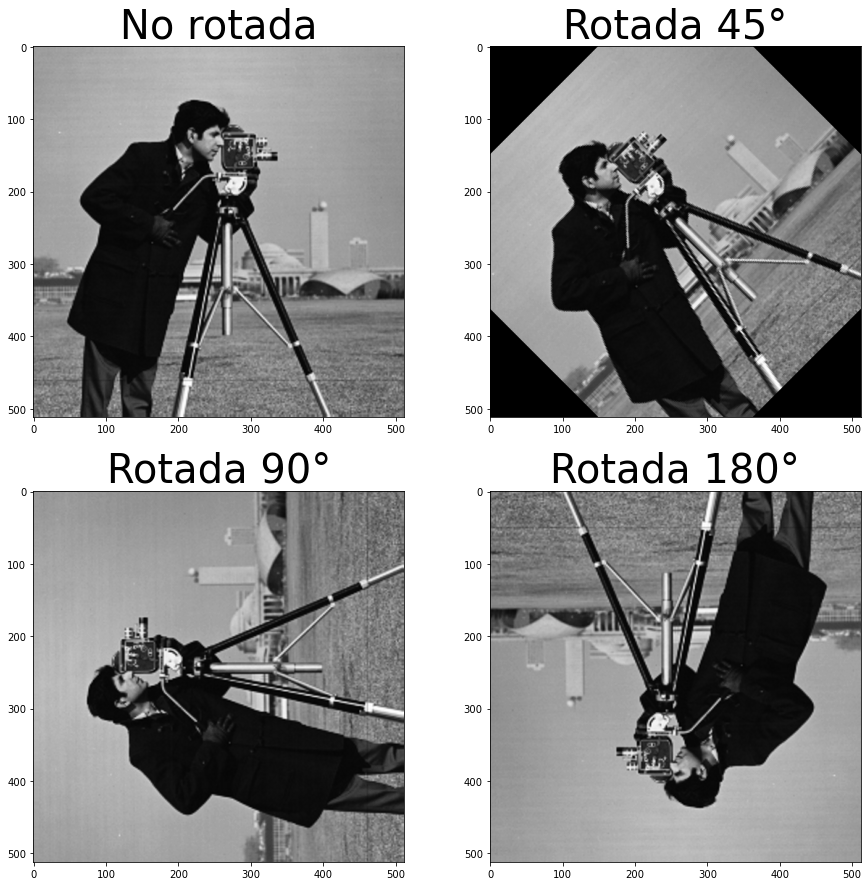

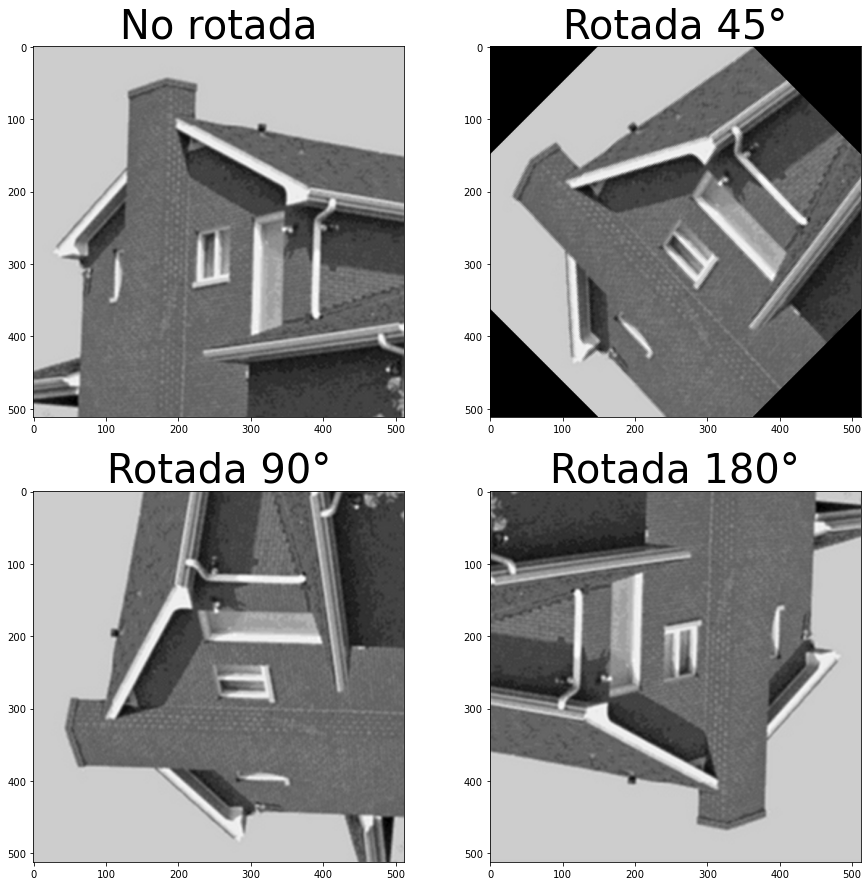

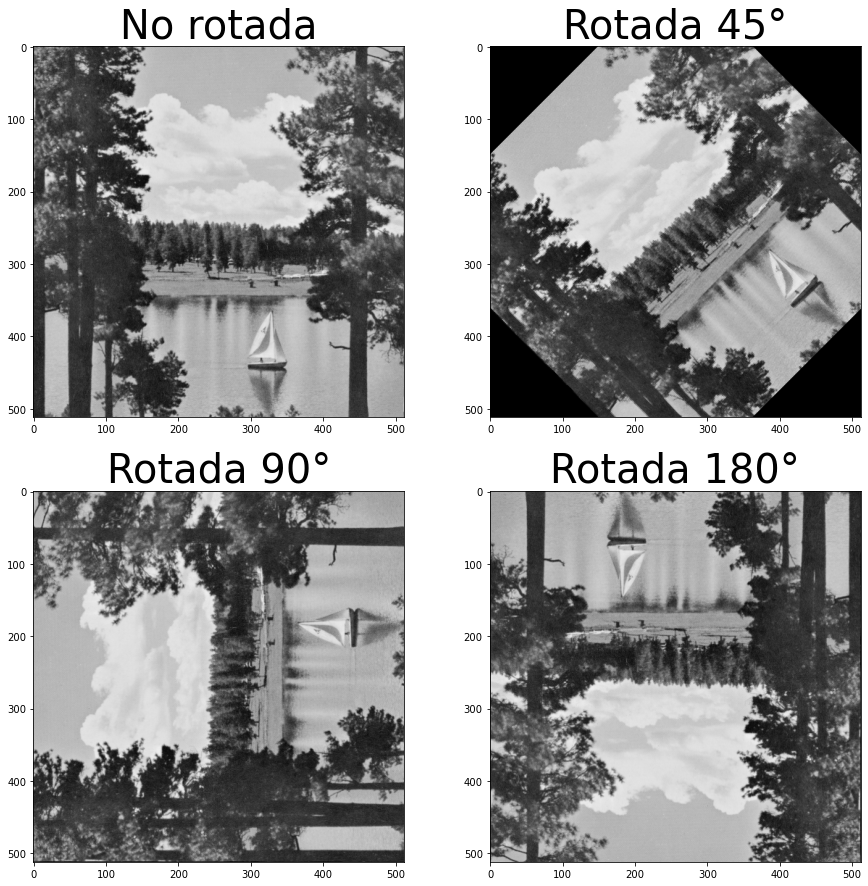

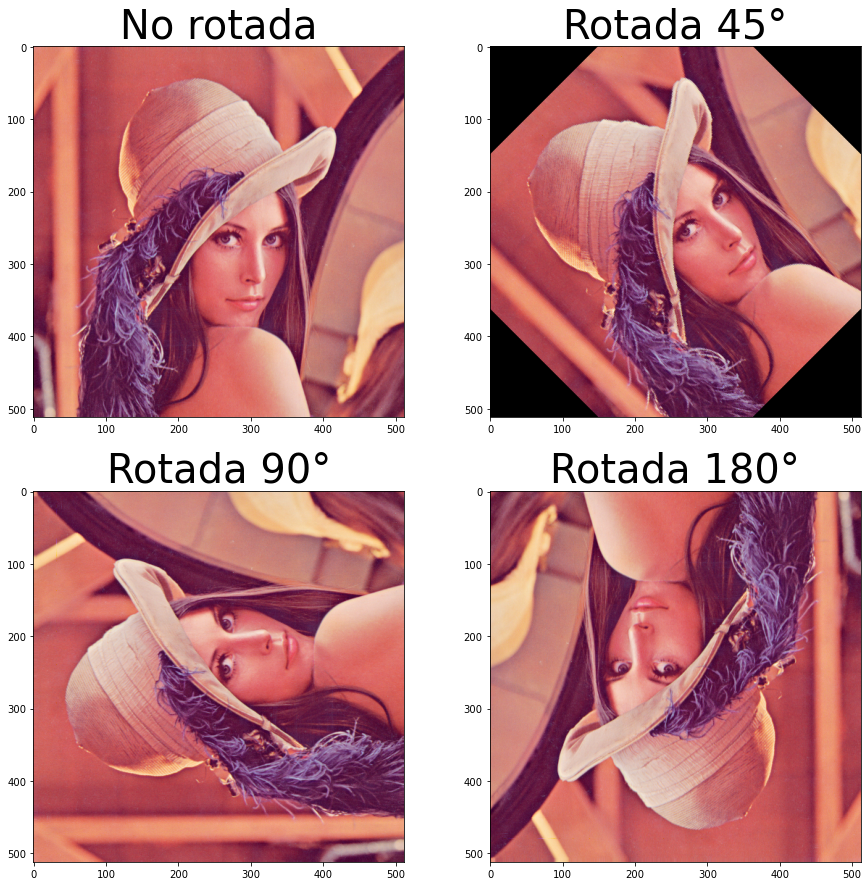

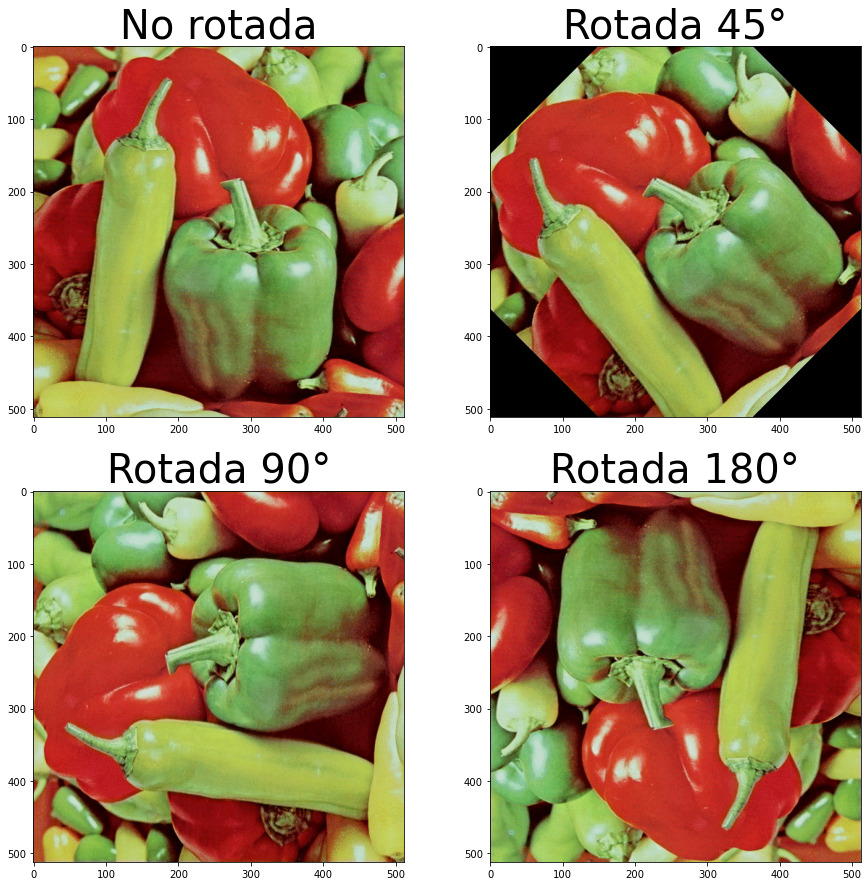

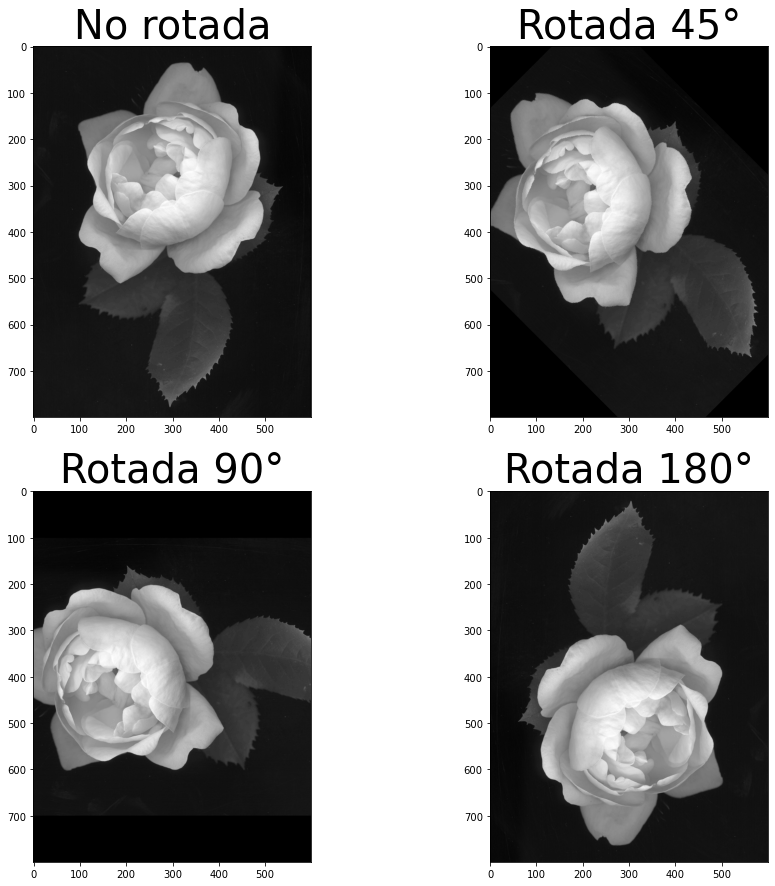

In [11]:
rotated_45 = {} # Diccionario de imagenes rotadas 45 grados
rotated_90 = {} # Diccionario de imagenes rotadas 90 grados 
rotated_180 = {} # Diccionario de imagenes rotadas 180 grados
for name in files: #por cada imagen en la carpeta
    fig, ax = plt.subplots(2, 2,figsize=(15,15))
    img = imagenes[name]
    rotated_45[name] = Image.fromarray(img).rotate(45)
    rotated_90[name] = Image.fromarray(img).rotate(90)
    rotated_180[name] = Image.fromarray(img).rotate(180)
    if( len(img.shape)==3): #Si es una imagen rgb    
        ax[0,0].imshow(img)
        ax[0,0].set_title('No rotada',size=40)
        ax[0,1].imshow(rotated_45[name])
        ax[0,1].set_title('Rotada 45°',size=40)
        ax[1,0].imshow(rotated_90[name])
        ax[1,0].set_title('Rotada 90°',size=40)
        ax[1,1].imshow(rotated_180[name])
        ax[1,1].set_title('Rotada 180°',size=40)
    else:
        ax[0,0].imshow(img,cmap="gray")
        ax[0,0].set_title('No rotada',size=40)
        ax[0,1].imshow(rotated_45[name],cmap='gray')
        ax[0,1].set_title('Rotada 45°',size=40)
        ax[1,0].imshow(rotated_90[name],cmap='gray')
        ax[1,0].set_title('Rotada 90°',size=40)
        ax[1,1].imshow(rotated_180[name],cmap='gray')
        ax[1,1].set_title('Rotada 180°',size=40)

In [12]:
for name in files:
    rotated_45[name].save(name[:-4]+'_rotate45.png', format='png')
    rotated_90[name].save(name[:-4]+'_rotate90.png', format='png')
    rotated_180[name].save(name[:-4]+'_rotate180.png', format='png')  